In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import binvox_rw
import numpy as np
%matplotlib inline

In [7]:
tmp = 180*np.linspace(-np.pi,np.pi,num=25)/np.pi
print(tmp[range(0,25,4)])
print(360-120)

[-180. -120.  -60.    0.   60.  120.  180.]
240


/home/daniyar/anaconda2/envs/python2/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


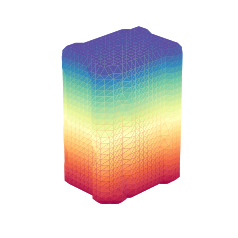

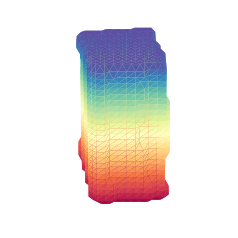

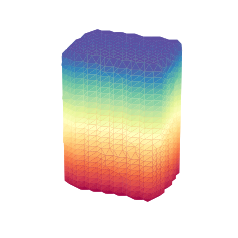

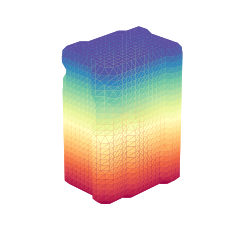

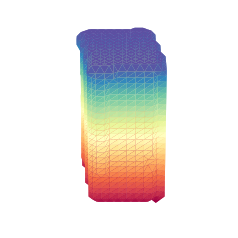

...

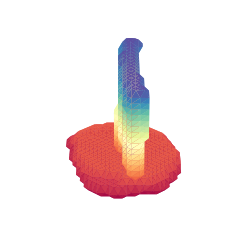

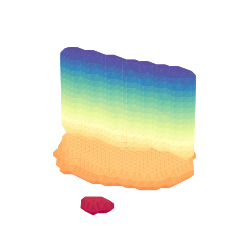

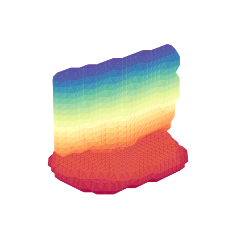

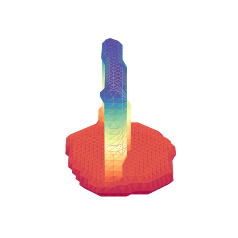

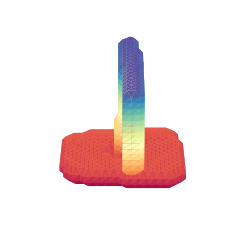

In [2]:
import numpy as np
from numpy import sin, cos, pi
from skimage import measure
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def render(binfile, outfile):
    with open(binfile) as f:
        vol = binvox_rw.read_as_3d_array(f).data.copy()
        verts, faces = measure.marching_cubes(vol, 0, spacing=(0.2, 0.2, 0.2))
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        ax.plot_trisurf(verts[:, 0], verts[:,1], faces, verts[:, 2], cmap='Spectral', lw=1)
        ax.grid(False)
        ax.view_init(elev=25., azim=45)
        ax.set_ylim([1,5])
        ax.set_xlim([1,5])
        ax.set_zlim([1,5])
        ax.set_aspect('equal')
        plt.axis('off')
        plt.savefig(outfile, bbox_inches='tight')

def batch_render(idx, dirname='modelnet_vis/'):
    prefix='binvox_'
    prefix2 = 'inp_binvox_'
    prefix = prefix + '%04d'%idx +'_'
    for oi, i in enumerate(range(0,25,4)):
        fname = prefix+ '%04d'%i
        outname = '%04d'%idx + '_' + '%04d'% oi
        binfile = dirname + fname + '.binvox'
        outfile = dirname + '/pngs/' + outname + '.png'
        render(binfile, outfile)
    fname = prefix2 + '%04d'%idx
    binfile = dirname + fname + '.binvox'
    outfile = dirname + '/pngs/inp' + '%04d'%idx + '.png'
    render(binfile, outfile)
        

for i in range(50):
    batch_render(i)